# 시뮬레이션 테스트

TCLab version 1.0.0
Simulated TCLab
0s: T=29.01, u=100.00 T2=28.6847 
1s: T=28.68, u=100.00 T2=28.6847 
2s: T=29.01, u=100.00 T2=29.006999999999998 
3s: T=29.01, u=100.00 T2=29.006999999999998 
4s: T=29.01, u=100.00 T2=29.006999999999998 
5s: T=29.01, u=100.00 T2=29.006999999999998 
6s: T=29.33, u=100.00 T2=29.006999999999998 
7s: T=29.33, u=100.00 T2=29.006999999999998 
8s: T=29.65, u=100.00 T2=29.329299999999996 
9s: T=29.65, u=100.00 T2=29.329299999999996 
10s: T=29.97, u=100.00 T2=29.329299999999996 
11s: T=29.97, u=100.00 T2=29.329299999999996 
12s: T=30.30, u=100.00 T2=29.6516 
13s: T=30.62, u=100.00 T2=29.6516 
14s: T=30.62, u=100.00 T2=29.6516 
15s: T=30.94, u=100.00 T2=29.973899999999997 
16s: T=31.26, u=100.00 T2=29.973899999999997 
17s: T=31.59, u=100.00 T2=30.2962 
18s: T=31.59, u=100.00 T2=30.2962 
19s: T=31.91, u=100.00 T2=30.618499999999997 
20s: T=32.23, u=100.00 T2=30.618499999999997 
21s: T=32.55, u=100.00 T2=30.940799999999996 
22s: T=32.87, u=100.00 T2=30.9407999999

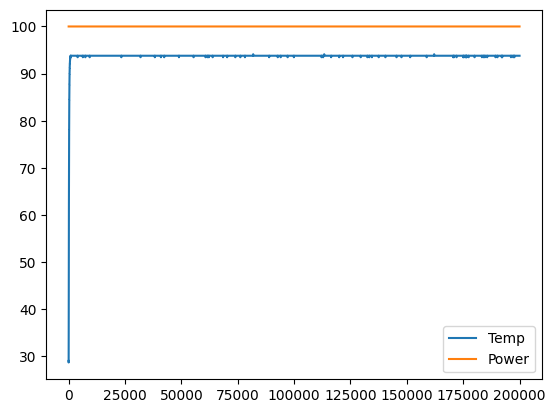

In [3]:
from tclab import setup
import time
import matplotlib.pyplot as plt

lab = setup(connected=False)

env= lab(synced=False)

setpoint = 50
Kp, Ki, Kd = 5, 0.1, 0.0
integral = 0
last_error = 0

temps, powers, times = [], [], []

start = time.time()
for i in range(200000):
    sim_time = i * 1
    env.update(t=sim_time)

    T = env.T1
    T2=env.T2
    env.Q1(100)
    env.Q2(100)

    times.append(sim_time)
    temps.append(T)
    powers.append(100)
    
    print(f"{i}s: T={T:.2f}, u={100:.2f} T2={T2} ")
    #time.sleep(1)

env.close()

plt.plot(times, temps, label='Temp')
plt.plot(times, powers, label='Power')
plt.legend()
plt.show()


# 키트 테스트

In [ ]:
import tclab
import numpy as np
import time
import csv
import matplotlib.pyplot as plt


# 초기화
a = tclab.TCLab()

     
setpoint = 50
Kp, Ki, Kd = 5, 0.1, 0.0
integral = 0
last_error = 0

temps, powers, times = [], [], []

start = time.time()
for i in range(60):
    t = time.time() - start
    T = a.T1
    print(type(T)) 
    error = setpoint - T
    integral += error
    derivative = error - last_error

    u = Kp*error + Ki*integral + Kd*derivative
    u = max(0, min(100, u))
    a.Q1(u)

    last_error = error
    times.append(t)
    temps.append(T)
    powers.append(u)
    
    print(f"{i}s: T={T:.2f}, u={u:.2f}")
    time.sleep(1)

a.Q1(0)
a.close()

plt.plot(times, temps, label='Temp')
plt.plot(times, powers, label='Power')
plt.legend()
plt.show()
